In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.optimize import curve_fit

In [2]:
# Make the plots a bit bigger to see
# NOTE: Must be done in a separate cell
plt.rcParams['figure.dpi'] = 100

In [3]:
# path1 = "Data_ccr/par_set_2_psd/vrun0_d2_40/"
# path1 = "../NoneqTrans2/Data_test/vrun3_d1_60/"
# path1 = "../NoneqTrans2/Data_test/80x80/vrun3_d1_60/"
path1 = "../../../../../../Volumes/Kunal_EHD/Work/Codes/RS_data_122920/par_set1_cbc/vrun1_d1_85/"
# path2 = "../NoneqTrans2/Data_test/80x80/vrun2_d1_40/"
# path1 = "../NoneqTrans2/Data_test/par_set1/vrun1_d1_75/"
# Python Data Single run
A1 = np.loadtxt(path1 + "delta_f2py_test.dat")
nn = np.size(A1,0)
print(np.shape(A1))

#### Python Data Voltage Up
E_up = A1[:,0]
# T_up = A1[:,0]
delta_up = A1[:,1]
I_up = A1[:,6]
Vs_up = A1[:,4]
R_up = A1[:,7]
# dR_up = A1[:,9]
# mx = 64
# my = 64

mx = 64
my = 64

inputs = open(path1+"input_par.dat", "r")
Nsamp = 128
maxdist = mx//2

Vcrit = 691.2
print(inputs.read())

(180, 11)
{'mx': 64, 'my': 64, 'nwarm': 400000, 'nskip': 16, 'Tc': 1.0, 'coef': 0.1, 'dphi': 0.2, 'gamma': 0.1, 'r0': 3.5, 'g2': 1.0, 'g4': -1.0, 'g6': 0.5, 'Rload': 1.0, 'mfphi': False, 'tloop': False}{'Tcrit': 1.32, 'dE': 0.1, 'minE': 0.1, 'maxE': 18.1, 'dTb': 0.01, 'minT': 0.01, 'maxT': 2.01, 'nmeas': 2048, 'Tbath': 0.85, 'seed': 37525891, 'NPEs': 1, 'iphi': True}


## Basic Dynamics

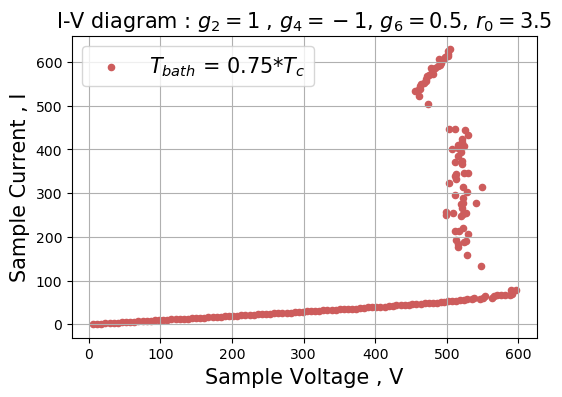

In [4]:
plt.scatter(Vs_up, I_up, s = 20.0, c = 'IndianRed', label='$T_{bath}$ = 0.75*$T_c$' , marker = 'o')
# plt.plot(Vs_up, I_up,  c = 'IndianRed')


# plt.plot(Data_Set[:,0],Data_Set[:,1])
plt.legend(fontsize = 15)
plt.title('I-V diagram : $g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$' , fontsize = 15)
# plt.title('I-V diagram , $n_{skip}$=32, $E$ = 0.1')
plt.xlabel('Sample Voltage , V', fontsize = 15 )
plt.ylabel('Sample Current , I', fontsize = 15 )
# plt.xlim(14.0,22.)
plt.grid(b=True,which='major', axis='both')
# plt.savefig(path1 + "I-V.pdf")

plt.show()

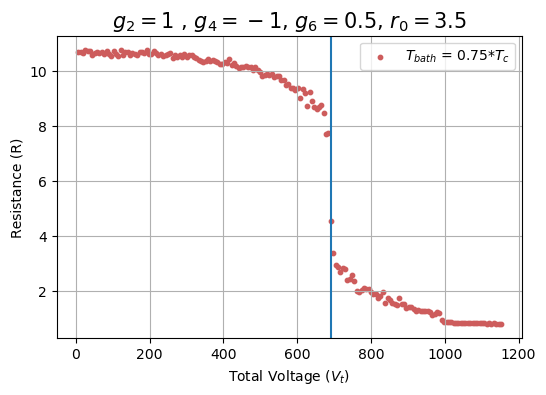

In [5]:
plt.scatter(E_up*my,R_up, s=10.0,c="IndianRed",label="$T_{bath}$ = 0.75*$T_c$")
plt.ylabel('Resistance (R)')
plt.xlabel('Total Voltage ($V_t$)')

# plt.scatter(E_up,delta_up, s=10.0,c="IndianRed", label = r'$\langle \Delta \rangle$')
# plt.ylabel( 'Average $\Delta$')
# plt.xlabel('Bath Temperature (T)')

# plt.xlim(18.,30.)
plt.axvline(x=Vcrit)
plt.title('$g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$' , fontsize = 15)
plt.grid(b=True,which='major', axis='both')
plt.legend()

# plt.savefig(path1 + "Resitance_v_Field.pdf")
plt.show()

In [6]:
# plt.scatter(E_up*my,delta_up, s=10.0,c="IndianRed",label="$T_{bath}$ = 0.85*$T_c$")
# plt.ylabel('Resistance (R)')
# plt.xlabel('Applied Field (E)')

# # plt.scatter(E_up,delta_up, s=10.0,c="IndianRed", label = r'$\langle \Delta \rangle$')
# # plt.ylabel( 'Average $\Delta$')
# # plt.xlabel('Bath Temperature (T)')

# # plt.xlim(18.,30.)
# plt.axvline(x=4.5)
# plt.title('$g_2 = 1$ , $g_4 = 1$, $g_6 = 0.0$, $r_0 = 2.$' , fontsize = 15)
# plt.grid(b=True,which='major', axis='both')
# plt.legend()

# # plt.savefig(path1 + "Resitance_v_Field.pdf")
# plt.show()

## Distribution plots 

In [7]:
#### Voltage Domain plots

mxphi = []
mnphi = []

mxdphi = []
mndphi = []
for i in range(nn):
    phi = np.loadtxt(path1 + "phi_val_"+ format(E_up[i], '.2f')+ "_"+ str(Nsamp-1)+ "_.dat")
    dphi = phi - np.mean(phi)
    mxphi.append(np.max(phi))
    mnphi.append(np.min(phi))
    mxdphi.append(np.max(dphi))
    mndphi.append(np.min(dphi))


maxphi = np.max(mxphi)
minphi = np.min(mnphi)
maxdphi = np.max(mxdphi)
mindphi = np.min(mndphi)
print( minphi, maxphi)
print(mindphi, maxdphi)

-1.9217534653097657 2.2661801457473625
-2.3157031157642853 1.9245452975575035


In [8]:
#### Voltage Domain plots


rows = 18
columns = 10
fig, axes = plt.subplots(figsize=(columns*10+15, rows*10+15 ))
# fig=plt.figure(figsize=(100, 8))
fig.suptitle = "$\phi$ distribution, $T_B = 0.85*T_C$"
for i in range(rows*columns):
    globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E_up[i], '.2f')+ "_"+ str(Nsamp-1)+ "_.dat")
    fig.add_subplot(rows, columns, (i+1))
    phi2 = (globals()["phi_" + str(i)])**2
    dist = plt.imshow(np.transpose((globals()["phi_" + str(i)])),cmap='plasma',origin='lower', vmin = minphi, vmax = maxphi)
    x, y = np.meshgrid(np.arange(mx), np.arange(my))
#     plt.contourf(x,y,np.transpose((globals()["phi_" + str(i)])), cmap='rainbow', vmin = -0.8, vmax = 1.5)
#     plt.colorbar(dist)
    plt.title("Vt = "+format(E_up[i]*my, '.2f') , fontsize = 80)
    plt.xlabel("m_x")
    plt.ylabel("m_y")
# plt.legend()


# plt.title('$N_{meas}$=1024, $g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$')
# fig.colorbar(dist)
# plt.savefig(path1 + "Dist_phi_Tbath=0.75*Tc.pdf",bbox_inches='tight')

plt.show()






In [9]:
#### Voltage Domain plots
# rows = 10
rows = 18
columns = 10
fig = plt.figure(figsize=(columns*10+15, rows*10+15 ))
E = 4.0
width1 = np.zeros(rows*columns)
for i in range(rows*columns):
#     if i%16 == 0:    
#     globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E_up[i], '.2f')+".dat")
    globals()["phi_" + str(i)] = np.loadtxt(path1 + "phi_val_"+ format(E_up[i], '.2f')+ "_"+ str(Nsamp-1)+ "_.dat")
    fig.add_subplot(rows, columns, (i+1))
    phi = (globals()["phi_" + str(i)])
    dphi = phi - np.mean(phi)
#     plt.imshow(np.transpose(phi2),cmap='rainbow')
    plt.imshow(np.transpose(dphi),extent=[0, mx, 0, my],cmap='plasma',origin='lower', vmin = mindphi, vmax = maxdphi)
#     x, y = np.meshgrid(np.arange(mx), np.arange(my))
#     plt.contourf(np.transpose(phi2))
#     plt.colorbar();
    plt.title("Vt = "+format(E_up[i]*my, '.2f') , fontsize = 80)
    E += 0.1
    plt.xlabel("m_x")
    plt.ylabel("m_y")
# plt.legend()


# plt.title('$N_{meas}$=8192, $g_2 = 1$ , $g_4 = 1$, $g_6 = 0.0$, $r_0 = 2.0$')
# plt.savefig(path1 + "Dist_dphi_Tbath=0.75*Tc.pdf",bbox_inches='tight')
# print(width)
plt.show()






## Pair Correlations along X and Y

In [10]:
#### Corelations along Y ####
def pair_corY(phi,a):
    nx,ny = np.shape(phi)
    gx = np.zeros(nx)
    for i in range(nx):
        gg = 0
        for j in range(ny):
            if j < (ny-a):
                gg += phi[i,(j+a)]*phi[i,j]
        gx[i] = gg/(ny-a)
    return np.mean(gx)
    

#### Correlations along X ####
def pair_corX(phi,a):
    nx,ny = np.shape(phi)
    gy = np.zeros(ny)
    for j in range(ny):
        gg = 0
        for i in range(nx):
            if i < (nx-a):
                gg += phi[(i+a),j]*phi[i,j]
        gy[j] = gg/(nx-a)
    return np.mean(gy)




In [11]:

# phi = np.loadtxt(path1 + "phi_val_6.20.dat")
# dphi = phi - np.mean(phi)

# # ff = pair_corX(dphi,2)
# # print(ff)
# # a = 0
# gofrx = []
# gofry = []

# for i in range(mx-1):
#     gg = pair_corX(dphi,i)
#     gofrx.append(gg)
    

# for j in range(my-1):
#     gg = pair_corY(dphi,j)
#     gofry.append(gg)
    
    
# plt.plot(gofrx, label = " pair correlation along X")
# plt.plot(gofry, label = " pair correlation along Y")
# # plt.axhline(y = 0.0)
# plt.ylabel("g(r)")
# plt.xlabel("r")
# plt.title("Electric field along Y")
# plt.grid(b=True,which='major', axis='both')
# plt.legend()
# plt.show()

In [12]:
# #### Voltage Domain plots
# # rows = 10
# # columns = 5
# # fig=plt.figure(figsize=(50, 100))
# # nn = 25
# Tot_V = []
# E = 0.1
# # E = 0.2
# # a = 4
# # maxdist = 79
# # width1 = np.zeros(rows*columns)
# Gx = np.zeros((nn,maxdist))
# Gy = np.zeros((nn,maxdist))

# for k in range(nn):
# #     phi = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+".dat")
#     phi = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_"+ str(Nsamp-1)+ "_.dat")
#     dphi = phi - np.mean(phi)
#     gofrx = []
#     gofry = []
#     dist = 0
#     for dist in range(maxdist):
#         gg = pair_corX(dphi,dist)
#         gofrx.append(gg)
#     dist = 0    
#     for dist in range(maxdist):
#         gg = pair_corY(dphi,dist)
#         gofry.append(gg)
#     Gx[k,:] = gofrx[:]
#     Gy[k,:] = gofry[:]
#     E += 0.1
# #     E += 0.2
#     Tot_V.append(E*80.0)
# #     plt.xlabel("m_x")
# #     plt.ylabel("m_y")
# # plt.legend()
# # plt.title('$N_{meas}$=1024, $g_2 = 1$ , $g_4 = -1$, $g_6 = 0.5$, $r_0 = 3.5$')
# # plt.savefig(path4 + "Dist_phi2_Tbath=0.6*Tc.pdf")
# # print(width)
# # plt.show()




# Gx = np.array(Gx)
# Gy = np.array(Gy)
# Tot_V = np.array(Tot_V)
# print(np.shape(Gx), np.shape(Gy)) 
# # Gx = np.abs(Gx)
# # Gy = np.abs(Gy)

In [13]:
# x_Ax = np.arange(mx-1)
# for i in range(nn):
#     plt.scatter(x_Ax,Gx[i,:])
#     plt.scatter(x_Ax,Gy[i,:])
#     plt.plot(Gx[i,:], label = "Pair correlation along X (perpendicular to field)" )
#     plt.plot(Gy[i,:], label = "Pair correlation along Y (parallel to field)" )
#     plt.ylabel("g(r)")
#     plt.xlabel("r") 
# #     plt.xlim(-1.,30)
#     plt.title("$V_t$ = "+ format(Tot_V[i],'.2f'))
#     plt.grid(b=True,which='major', axis='both')
#     plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
# #     plt.savefig(path2 + "gofr_Vt_"+format(Tot_V[i],'.2f')+"_.pdf",bbox_inches='tight')
#     plt.show()

In [14]:
# phi = np.loadtxt(path1 + "phi_val_6.20.dat")
# phi = np.loadtxt(path1 + "phi_val_6.40_255_.dat")
dphi = phi - np.mean(phi)
# maxdist = 79
# N = [10, 15, 20, 25, 30]
Gx_full = np.zeros((nn,maxdist*Nsamp))
Gy_full = np.zeros((nn,maxdist*Nsamp))
Gx_fft = np.zeros((nn,maxdist))
Gy_fft = np.zeros((nn,maxdist))

G_x = np.zeros((nn,maxdist))
G_y = np.zeros((nn,maxdist))
k = 0 
for E in E_up:    
    Gx_ = np.zeros((Nsamp,maxdist))
    Gy_ = np.zeros((Nsamp,maxdist))
    
    gxfft = np.zeros((Nsamp,maxdist))
    gyfft = np.zeros((Nsamp,maxdist))
    for l in range(Nsamp):
#         i = np.random.randint(0,mx)
#         j = np.random.randint(0,my)
#         dphi1 = dphi[i:i+n,j:j+n]
        phi = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_"+ str(l)+ "_.dat")
        dphi = phi - np.mean(phi)
        gofrx = []
        gofry = []
        dist = 0
        for dist in range(maxdist):
            gg = pair_corX(dphi,dist)
            gofrx.append(gg)
        dist = 0    
        for dist in range(maxdist):
            gg = pair_corY(dphi,dist)
            gofry.append(gg)
        Gx_[l,:] = gofrx[:]
        Gy_[l,:] = gofry[:]
        gxfft[l,:] = np.abs(np.fft.fft(gofrx[:]))
        gyfft[l,:] = np.abs(np.fft.fft(gofry[:]))
#         Gx_full[k,:,l] = gofrx[:]
#         Gy_full[k,:,l] = gofry[:]
    
    Gx_full[k,:] = Gx_.flatten('F')
    Gy_full[k,:] = Gy_.flatten('F')
    x_ax = np.arange(0,maxdist)
    G_x[k,:] = np.mean(Gx_,axis = 0)
    G_y[k,:] = np.mean(Gy_,axis = 0)
    
    Gx_fft[k,:] = np.mean(gxfft,axis=0)
    Gy_fft[k,:] = np.mean(gyfft,axis=0)
    k +=1
#     plt.plot(x_ax,G_x[k,:], label = " Perpendicular to the field")
#     plt.plot(x_ax,G_y[k,:], label = " Parallel to field")
    
#     plt.ylabel("g(r)")
#     plt.xlabel("r")
#     plt.title("E = "+ format(E*80.,'.2f'))
#     plt.grid(b=True,which='major', axis='both')
#     plt.legend()
# #     plt.savefig(path1 + "corr_n_"+str(n)+"_.pdf")
#     plt.savefig(path2 + "gofr_Vt_"+format(E*my,'.2f')+"_cbc.pdf",bbox_inches='tight')
# #     plt.show()

np.savetxt(path1 + 'gofr_x.dat', G_x)
np.savetxt(path1 + 'gofr_y.dat', G_y)

np.savetxt(path1 + 'gofr_x_full.dat', Gx_full)
np.savetxt(path1 + 'gofr_y_full.dat', Gy_full)

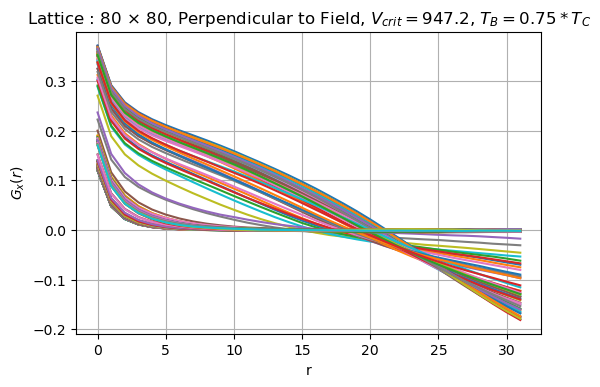

In [15]:
for k in range(0,nn):
    plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(mx), '.2f') )

plt.title(r'Lattice : 80 $\times$ 80, Perpendicular to Field, $V_{crit} = 947.2$, $T_B = 0.75*T_C$')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_x(r)$')
plt.xlabel('r')

# plt.savefig(path1 + "gofrx_75%_full.pdf",bbox_inches='tight')
plt.show()    

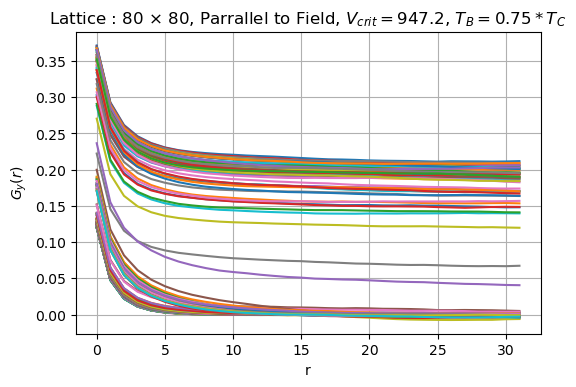

In [16]:
for k in range(0,nn):
    plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(my), '.2f') )

plt.title(r'Lattice : 80 $\times$ 80, Parrallel to Field, $V_{crit} = 947.2$, $T_B = 0.75*T_C$')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_y(r)$')
plt.xlabel('r')  
# plt.savefig(path1 + "gofry_75%_full.pdf",bbox_inches='tight')
plt.show()    

Text(0.5, 0, 'r')

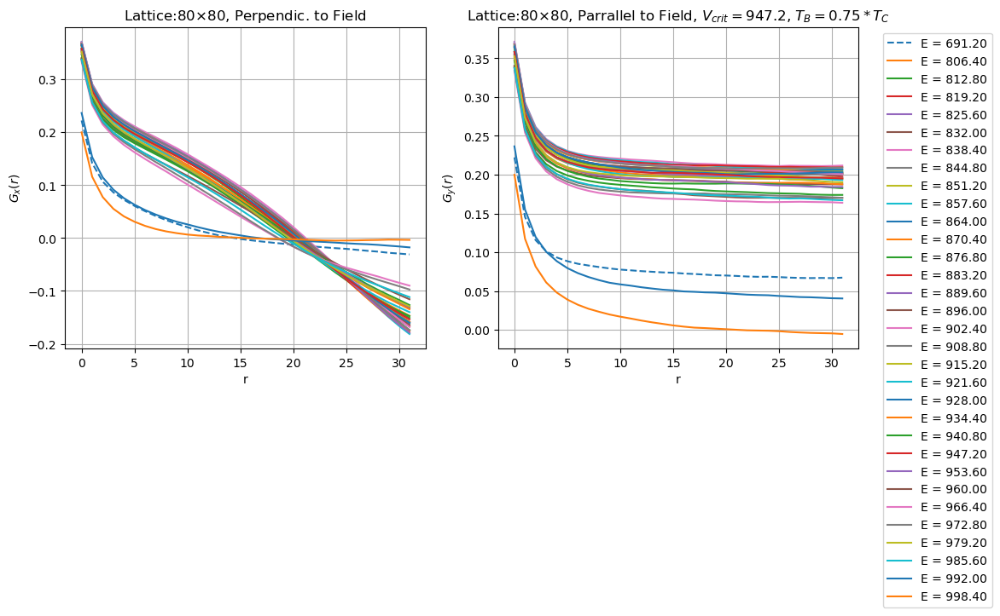

In [17]:
f = plt.figure(figsize=(12, 5)); # plot the calculated values    


sp =  f.add_subplot(1, 2, 1 );
for k in range(0,nn):
    if E_up[k]*my == Vcrit:
        plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), linestyle = 'dashed' )
    elif E_up[k]*my > 800. and E_up[k]*my < 1000. :
#     if k%4 == 0:
        plt.plot(x_ax,G_x[k,:],label = "E = " + format(E_up[k]*(my), '.2f') )
    else:
        None

plt.title(r'Lattice:80$\times$80, Perpendic. to Field')

# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_x(r)$')
plt.xlabel('r')
   
# plt.show()    


sp =  f.add_subplot(1, 2, 2 );
for k in range(0,nn):
    if E_up[k]*my == Vcrit:
        plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(my), '.2f'), linestyle = 'dashed' )
    elif E_up[k]*my > 800. and E_up[k]*my < 1000. :
#     if k%4 == 0:
        plt.plot(x_ax,G_y[k,:],label = "E = " + format(E_up[k]*(my), '.2f') )
    else:
        None



plt.title(r'Lattice:80$\times$80, Parrallel to Field, $V_{crit} = 947.2$, $T_B = 0.75*T_C$')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(b=True,which='major', axis='both')
plt.ylabel('$G_y(r)$')
plt.xlabel('r')  
# plt.show()


# plt.savefig(path1 + "gofr_75%.pdf",bbox_inches='tight')

In [18]:
# print(np.shape(Gx_fft),np.shape(Gx_fft))

In [19]:
# klabels = np.fft.fftfreq(mx-1, d=1)
# klabels = np.fft.fftshift(klabels)
# Gx_fft = np.fft.fftshift(Gx_fft,axes=1)
# Gy_fft = np.fft.fftshift(Gy_fft,axes=1)
# # print(klabels)
# k = 0
# for E in E_up:
#     plt.plot(klabels,Gx_fft[k,:], label = " Perpendicular to the field")
#     plt.plot(klabels,Gy_fft[k,:], label = " Parallel to field")
#     k += 1
#     plt.ylabel("g(k)")
#     plt.xlabel("k")
#     plt.title("E = "+ format(E*80.,'.2f'))
#     plt.grid(b=True,which='major', axis='both')
#     plt.legend()
# #     plt.savefig(path1 + "corr_n_"+str(n)+"_.pdf")
# #     plt.savefig(path1 + "gofr_fft_"+format(E*80.,'.2f')+"_cbc.pdf",bbox_inches='tight')
#     plt.show()